In [1]:
import os
import cv2
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt

In [2]:
img_dir = 'Airplanes and ships.v3i.yolov11/train/images'
label_dir = 'Airplanes and ships.v3i.yolov11/train/labels'
out_img_dir = 'Airplanes and ships.v3i.yolov11_augmented/train/images'
out_label_dir = 'Airplanes and ships.v3i.yolov11_augmented/train/labels'

In [3]:
os.makedirs(out_img_dir, exist_ok=True)
os.makedirs(out_label_dir, exist_ok=True)
print(f"Output directories created/ensured at: {out_img_dir} and {out_label_dir}")

Output directories created/ensured at: Airplanes and ships.v3i.yolov11_augmented/train/images and Airplanes and ships.v3i.yolov11_augmented/train/labels


In [3]:
AUGMENTATIONS_PER_IMAGE = 9

In [ ]:
pre_transform = A.Compose([
    A.LongestMaxSize(max_size=1920),
    A.PadIfNeeded(min_height=1920, min_width=1920, border_mode=cv2.BORDER_CONSTANT, value=(0,0,0)),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'], min_visibility=0.1))

transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=10, p=0.75, border_mode=cv2.BORDER_CONSTANT, value=0),
    A.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0, p=0.75),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.22),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

heavy_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=90, p=0.8, border_mode=cv2.BORDER_CONSTANT, value=(0,0,0)),
    A.RandomScale(scale_limit=0.2, p=0.5),

    A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.8),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.8),
    A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5),

    A.ISONoise(color_shift=(0.01, 0.05), intensity=(0.1, 0.5), p=0.3),

], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'], min_visibility=0.1))

C:\Users\bhuvan.NRSCADMIN\AppData\Local\Temp\ipykernel_19676\939213866.py:3: UserWarning: Argument(s) 'value' are not valid for transform PadIfNeeded
  A.PadIfNeeded(min_height=1920, min_width=1920, border_mode=cv2.BORDER_CONSTANT, value=(0,0,0)),
C:\Users\bhuvan.NRSCADMIN\AppData\Local\Temp\ipykernel_19676\939213866.py:9: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A.Rotate(limit=10, p=0.75, border_mode=cv2.BORDER_CONSTANT, value=0),
C:\Users\bhuvan.NRSCADMIN\AppData\Local\Temp\ipykernel_19676\939213866.py:12: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.22),
C:\Users\bhuvan.NRSCADMIN\AppData\Local\Temp\ipykernel_19676\939213866.py:19: UserWarning: Argument(s) 'value' are not valid for transform Rotate
  A.Rotate(limit=90, p=0.8, border_mode=cv2.BORDER_CONSTANT, value=(0,0,0)), # Aggressive rotation


In [ ]:
image_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
total_images = len(image_files)

for i, filename in enumerate(image_files):
    print(f"Processing image {i+1}/{total_images}: {filename}")

    img_path = os.path.join(img_dir, filename)
    label_path = os.path.join(label_dir, os.path.splitext(filename)[0] + '.txt')

    image = cv2.imread(img_path)
    if image is None:
        print(f"  ! Warning: Could not read image {filename}. Skipping.")
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    bboxes = []
    class_labels = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_labels.append(int(parts[0]))
                bboxes.append([float(p) for p in parts[1:]])
    
    try:
        pre_processed = pre_transform(image=image, bboxes=bboxes, class_labels=class_labels)
        base_image = pre_processed['image']
        base_bboxes = pre_processed['bboxes']
        base_class_labels = pre_processed['class_labels']
    except Exception as e:
        print(f"  ! Error during pre-processing of {filename}: {e}. Skipping.")
        continue

    cv2.imwrite(os.path.join(out_img_dir, filename), cv2.cvtColor(base_image, cv2.COLOR_RGB2BGR))
    with open(os.path.join(out_label_dir, os.path.splitext(filename)[0] + '.txt'), 'w') as f:
        for lbl, bbox in zip(base_class_labels, base_bboxes):
            f.write(f"{int(lbl)} {' '.join(map(str, bbox))}\n")

    for j in range(AUGMENTATIONS_PER_IMAGE):
        if not base_bboxes: 
            continue
            
        try:
            augmented = transform(image=base_image, bboxes=base_bboxes, class_labels=base_class_labels)
            aug_image = augmented['image']
            aug_bboxes = augmented['bboxes']
            
            if not aug_bboxes:
                print(f"  ! All objects were lost in augmentation #{j+1} for {filename}. Skipping save.")
                continue
  
            base_name, ext = os.path.splitext(filename)
            new_img_name = f"{base_name}_aug_{j}{ext}"
            new_label_name = f"{base_name}_aug_{j}.txt"

            cv2.imwrite(os.path.join(out_img_dir, new_img_name), cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR))
            with open(os.path.join(out_label_dir, new_label_name), 'w') as f:
                for lbl, bbox in zip(augmented['class_labels'], aug_bboxes):
                    f.write(f"{int(lbl)} {' '.join(map(str, bbox))}\n")

        except Exception as e:
            print(f"  ! Could not augment {filename} (iteration {j}): {e}")

print(f"\nAugmentation complete! Check the output directories.")

Processing image 1/42: Agartala_air_png.rf.e0cdfd1968e90aacf256568a24c1f3d1.jpg
Processing image 2/42: Ahmedbad_air_png.rf.fb3ff0806baa0b033634d6e10d7028a6.jpg
Processing image 3/42: Bengaluru_air_png.rf.a73e60d576d6bc4d266afed4020d93e4.jpg
Processing image 4/42: Bhopal_air_png.rf.faff05c95e0d7c0ee3b2cc1f2796c49b.jpg
Processing image 5/42: Bhubaneswar_air_png.rf.918d4239898f13e956acb3ec3aebdf09.jpg
Processing image 6/42: Chandigarh_air_png.rf.a3b47a0d7d66a9e56693ff8eadbb61ea.jpg
Processing image 7/42: Chennai_sea_a_png.rf.f43f780696d2ed51481a5e5e4b355250.jpg
Processing image 8/42: Chennai_sea_b_png.rf.3f59efdaa14f625fc0c28b7718614d29.jpg
Processing image 9/42: Cochin_air_png.rf.1e428b26864f6722b60d7cb0384e61df.jpg
Processing image 10/42: Cochin_sea_a_png.rf.0ff883d1f719a867024b8edd105aa137.jpg
Processing image 11/42: Cochin_sea_b_png.rf.4f33d47acb6261846bb9c3f948d94867.jpg
Processing image 12/42: Coimbatore_air_png.rf.c88acf81fd305ffb76aeb0d02fe743b8.jpg
Processing image 13/42: Dabolim

In [7]:
out_img_dir_hv = 'Airplanes and ships.v3i.yolov11_augmented_hv/train/images'
out_label_dir_hv = 'Airplanes and ships.v3i.yolov11_augmented_hv/train/labels'
os.makedirs(out_img_dir_hv, exist_ok=True)
os.makedirs(out_label_dir_hv, exist_ok=True)
print(f"Output directories created/ensured at: {out_img_dir_hv} and {out_label_dir_hv}")

Output directories created/ensured at: Airplanes and ships.v3i.yolov11_augmented_hv/train/images and Airplanes and ships.v3i.yolov11_augmented_hv/train/labels


In [ ]:
# for heavy transforms

image_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
total_images = len(image_files)

for i, filename in enumerate(image_files):
    print(f"Processing image {i+1}/{total_images}: {filename}")

    img_path = os.path.join(img_dir, filename)
    label_path = os.path.join(label_dir, os.path.splitext(filename)[0] + '.txt')

    image = cv2.imread(img_path)
    if image is None:
        print(f"  ! Warning: Could not read image {filename}. Skipping.")
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    bboxes = []
    class_labels = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_labels.append(int(parts[0]))
                bboxes.append([float(p) for p in parts[1:]])
    
    try:
        pre_processed = pre_transform(image=image, bboxes=bboxes, class_labels=class_labels)
        base_image = pre_processed['image']
        base_bboxes = pre_processed['bboxes']
        base_class_labels = pre_processed['class_labels']
    except Exception as e:
        print(f"  ! Error during pre-processing of {filename}: {e}. Skipping.")
        continue

    cv2.imwrite(os.path.join(out_img_dir_hv, filename), cv2.cvtColor(base_image, cv2.COLOR_RGB2BGR))
    with open(os.path.join(out_label_dir_hv, os.path.splitext(filename)[0] + '.txt'), 'w') as f:
        for lbl, bbox in zip(base_class_labels, base_bboxes):
            f.write(f"{int(lbl)} {' '.join(map(str, bbox))}\n")

    for j in range(AUGMENTATIONS_PER_IMAGE):
        if not base_bboxes: 
            continue
            
        try:
            augmented = heavy_transform(image=base_image, bboxes=base_bboxes, class_labels=base_class_labels)
            aug_image = augmented['image']
            aug_bboxes = augmented['bboxes']
            
            if not aug_bboxes:
                print(f"  ! All objects were lost in augmentation #{j+1} for {filename}. Skipping save.")
                continue

            base_name, ext = os.path.splitext(filename)
            new_img_name = f"{base_name}_aug_{j}{ext}"
            new_label_name = f"{base_name}_aug_{j}.txt"

            cv2.imwrite(os.path.join(out_img_dir_hv, new_img_name), cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR))
            with open(os.path.join(out_label_dir_hv, new_label_name), 'w') as f:
                for lbl, bbox in zip(augmented['class_labels'], aug_bboxes):
                    f.write(f"{int(lbl)} {' '.join(map(str, bbox))}\n")

        except Exception as e:
            print(f"  ! Could not augment {filename} (iteration {j}): {e}")

print(f"\nAugmentation complete! Check the output directories.")

Processing image 1/42: Agartala_air_png.rf.e0cdfd1968e90aacf256568a24c1f3d1.jpg
Processing image 2/42: Ahmedbad_air_png.rf.fb3ff0806baa0b033634d6e10d7028a6.jpg
Processing image 3/42: Bengaluru_air_png.rf.a73e60d576d6bc4d266afed4020d93e4.jpg
Processing image 4/42: Bhopal_air_png.rf.faff05c95e0d7c0ee3b2cc1f2796c49b.jpg
Processing image 5/42: Bhubaneswar_air_png.rf.918d4239898f13e956acb3ec3aebdf09.jpg
Processing image 6/42: Chandigarh_air_png.rf.a3b47a0d7d66a9e56693ff8eadbb61ea.jpg
Processing image 7/42: Chennai_sea_a_png.rf.f43f780696d2ed51481a5e5e4b355250.jpg
Processing image 8/42: Chennai_sea_b_png.rf.3f59efdaa14f625fc0c28b7718614d29.jpg
Processing image 9/42: Cochin_air_png.rf.1e428b26864f6722b60d7cb0384e61df.jpg
Processing image 10/42: Cochin_sea_a_png.rf.0ff883d1f719a867024b8edd105aa137.jpg
Processing image 11/42: Cochin_sea_b_png.rf.4f33d47acb6261846bb9c3f948d94867.jpg
Processing image 12/42: Coimbatore_air_png.rf.c88acf81fd305ffb76aeb0d02fe743b8.jpg
Processing image 13/42: Dabolim

In [9]:
def visualise_bboxes(img_path,bboxes_path):
    yolo_lines = []
    
    with open(bboxes_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            cls = int(parts[0])
            cx, cy, w, h = map(float, parts[1:])
            yolo_lines.append((cls, cx, cy, w, h))
            
    img = cv2.imread(img_path)

    for cls, cx, cy, bw, bh in yolo_lines:
        cx *= img.shape[1]   
        cy *= img.shape[0]   
        bw *= img.shape[1]
        bh *= img.shape[0]
    
        x1 = int(cx - bw / 2)
        y1 = int(cy - bh / 2)
        x2 = int(cx + bw / 2)
        y2 = int(cy + bh / 2)
    
        cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)
    
    # Show the image
    plt.figure(figsize=(18,22))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

Attempting to display 5 random images with bounding boxes...

✅ Visualizing: Vishakhapatanam_sea_png.rf.771045f43b7b4137d02bd0e2e7e5255f_aug_3.jpg


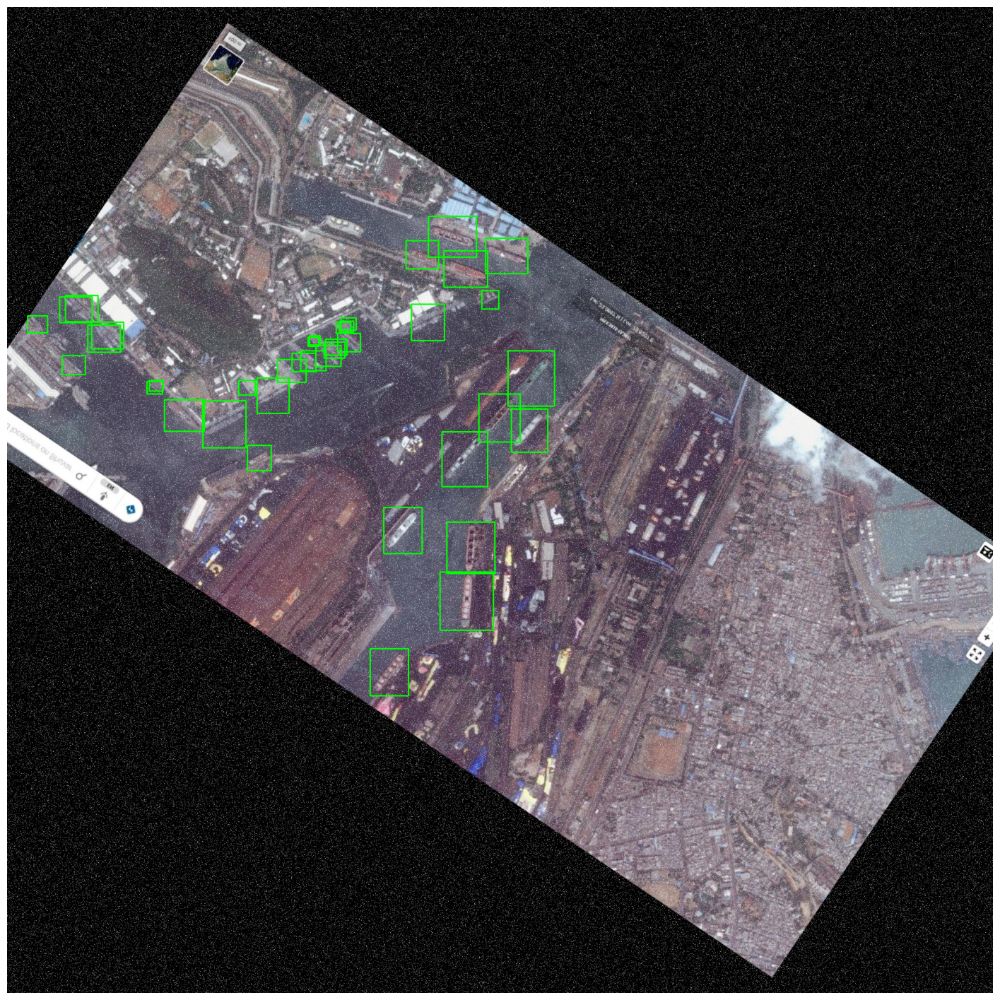


✅ Visualizing: Dhamara_odisha_sea_png.rf.f02fa0f498b49ad9ca48b9eedb92e76e_aug_4.jpg


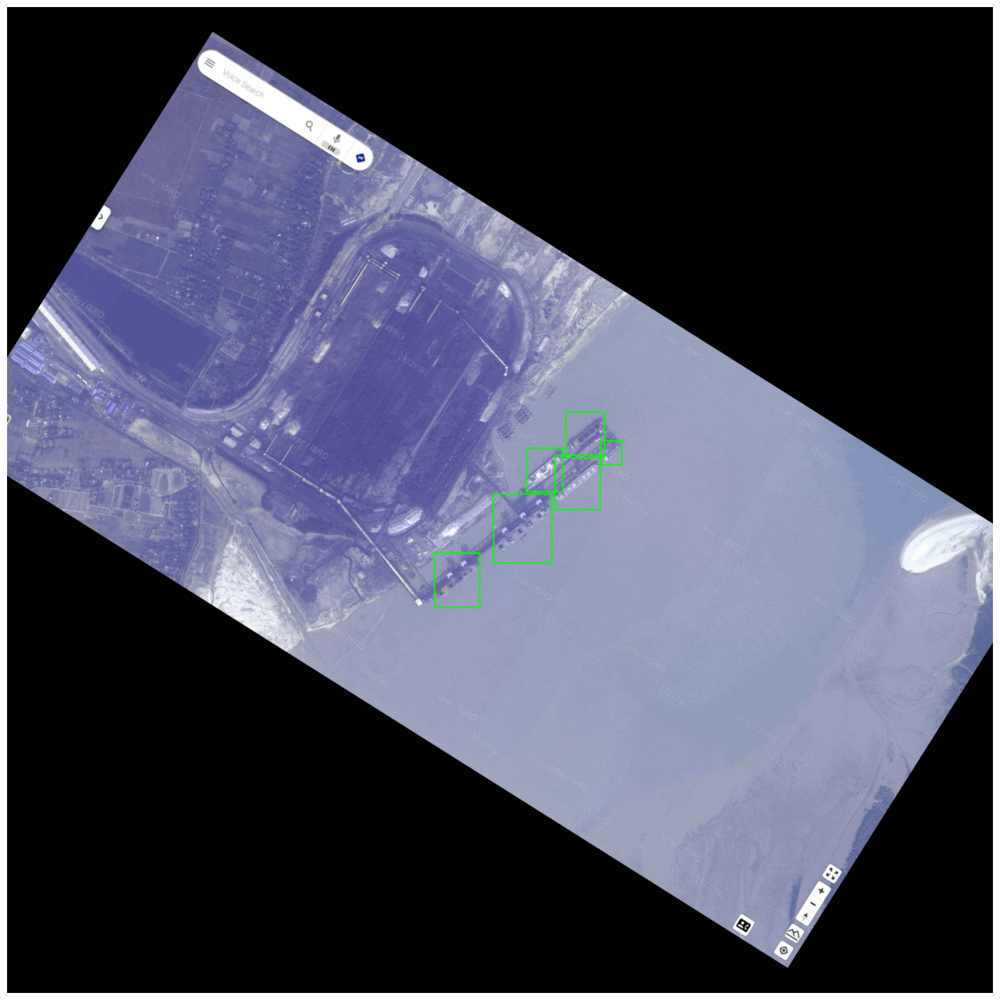


✅ Visualizing: Kolkata_air_png.rf.d6083a36a93ee7242ccbfef156b8d0e8_aug_0.jpg


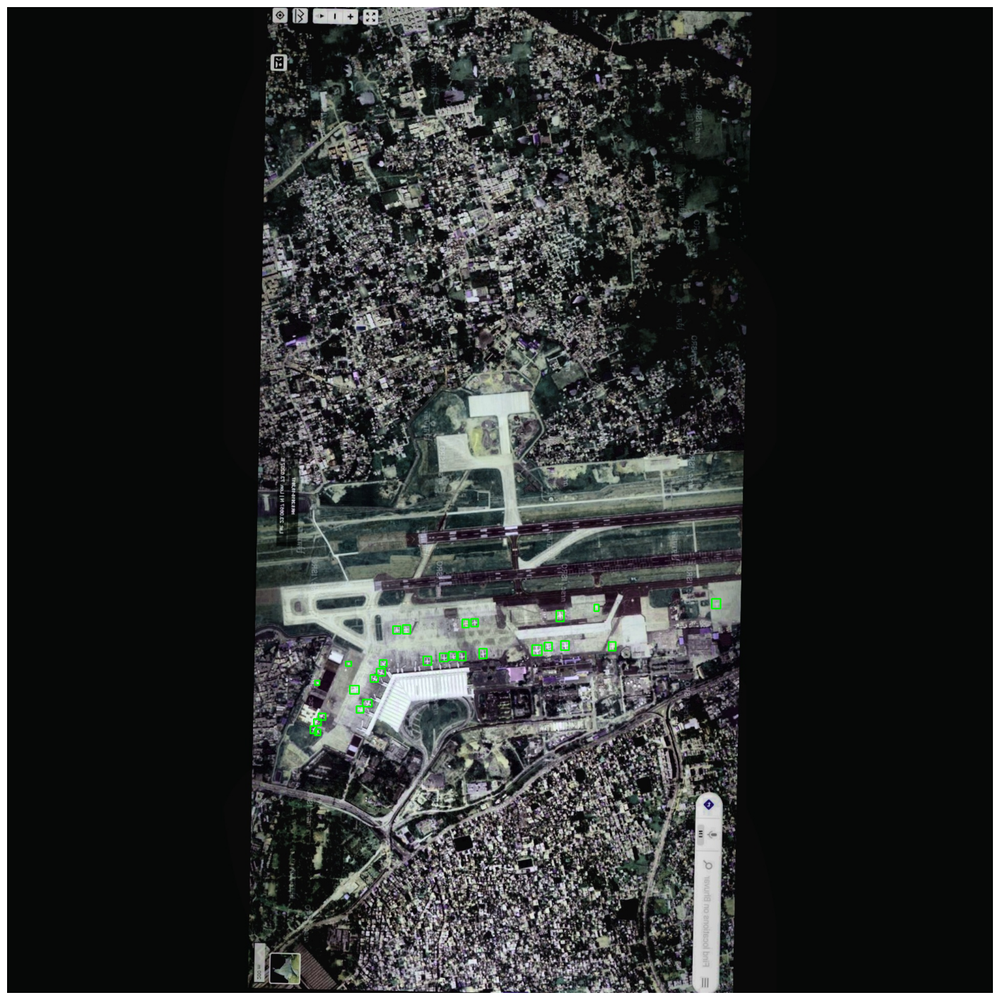


✅ Visualizing: Guwahati_air_png.rf.f23442eaa6aa7db1c123633a8185d4c3_aug_2.jpg


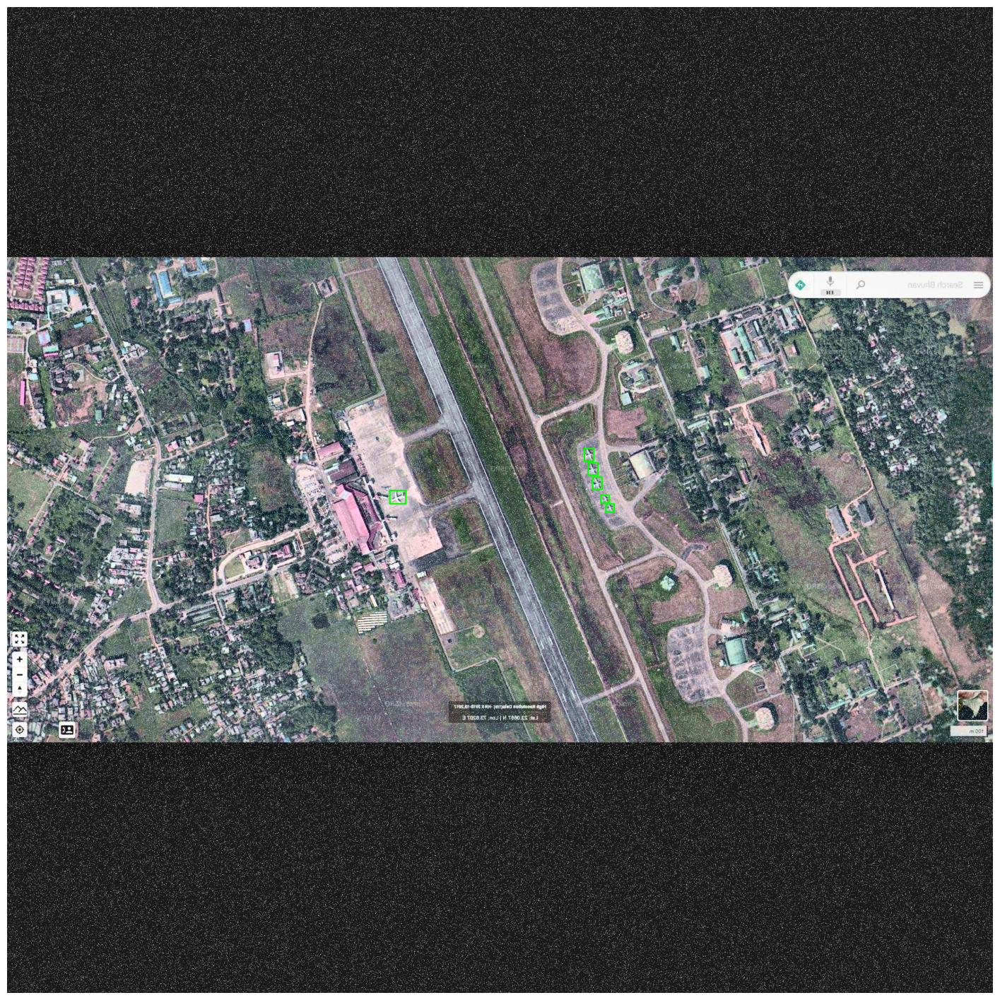


✅ Visualizing: Chennai_sea_a_png.rf.f43f780696d2ed51481a5e5e4b355250_aug_5.jpg


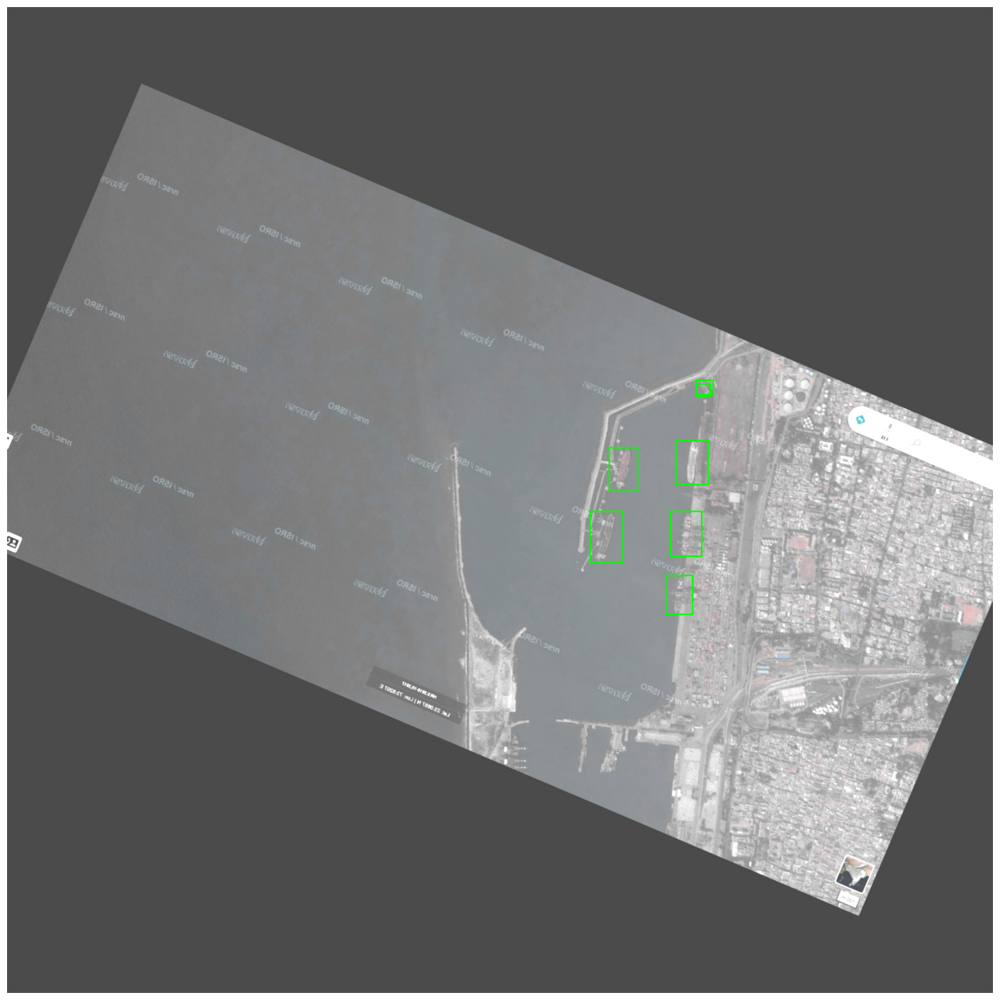

In [ ]:
import os
import random

img_dir = 'Airplanes and ships.v3i.yolov11_augmented_hv/train/images'
bboxes_dir = 'Airplanes and ships.v3i.yolov11_augmented_hv/train/labels'

try:
    all_images = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
except FileNotFoundError:
    print(f"Error: The image directory was not found at '{img_dir}'")
    all_images = []

num_to_visualize = 5

if not all_images:
    print("No images found to display.")
else:
    print(f"Attempting to display {num_to_visualize} random images with bounding boxes...")
    

    for _ in range(min(num_to_visualize, len(all_images))):

        image_name = random.choice(all_images)
        img_path = os.path.join(img_dir, image_name)

        
        label_name = os.path.splitext(image_name)[0] + '.txt'
        bboxes_path = os.path.join(bboxes_dir, label_name)


        if os.path.exists(bboxes_path):
            print(f"\n✅ Visualizing: {image_name}")

            visualise_bboxes(img_path, bboxes_path)
        else:
            print(f"\n Skipping {image_name}: Label file not found.")

In [3]:
img_dir = 'Airplanes and ships.v8i.yolov11/train/images'
label_dir = 'Airplanes and ships.v8i.yolov11/train/labels'
out_img_dir_hv = 'Airplanes and ships.v8i.yolov11_augmented_hv/train/images'
out_label_dir_hv = 'Airplanes and ships.v8i.yolov11_augmented_hv/train/labels'
AUGMENTATIONS_PER_IMAGE = 9
os.makedirs(out_img_dir_hv, exist_ok=True)
os.makedirs(out_label_dir_hv, exist_ok=True)
print(f"Output directories created/ensured at: {out_img_dir_hv} and {out_label_dir_hv}")

Output directories created/ensured at: Airplanes and ships.v8i.yolov11_augmented_hv/train/images and Airplanes and ships.v8i.yolov11_augmented_hv/train/labels


In [ ]:

# for heavy transforms

image_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
total_images = len(image_files)

for i, filename in enumerate(image_files):
    print(f"Processing image {i+1}/{total_images}: {filename}")

    img_path = os.path.join(img_dir, filename)
    label_path = os.path.join(label_dir, os.path.splitext(filename)[0] + '.txt')

    image = cv2.imread(img_path)
    if image is None:
        print(f"  ! Warning: Could not read image {filename}. Skipping.")
        continue
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    bboxes = []
    class_labels = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_labels.append(int(parts[0]))
                bboxes.append([float(p) for p in parts[1:]])
    
    try:
        pre_processed = pre_transform(image=image, bboxes=bboxes, class_labels=class_labels)
        base_image = pre_processed['image']
        base_bboxes = pre_processed['bboxes']
        base_class_labels = pre_processed['class_labels']
    except Exception as e:
        print(f"  ! Error during pre-processing of {filename}: {e}. Skipping.")
        continue

    cv2.imwrite(os.path.join(out_img_dir_hv, filename), cv2.cvtColor(base_image, cv2.COLOR_RGB2BGR))
    with open(os.path.join(out_label_dir_hv, os.path.splitext(filename)[0] + '.txt'), 'w') as f:
        for lbl, bbox in zip(base_class_labels, base_bboxes):
            f.write(f"{int(lbl)} {' '.join(map(str, bbox))}\n")

    for j in range(AUGMENTATIONS_PER_IMAGE):
        if not base_bboxes: 
            continue
            
        try:
            augmented = heavy_transform(image=base_image, bboxes=base_bboxes, class_labels=base_class_labels)
            aug_image = augmented['image']
            aug_bboxes = augmented['bboxes']
            
            if not aug_bboxes:
                print(f"  ! All objects were lost in augmentation #{j+1} for {filename}. Skipping save.")
                continue

            base_name, ext = os.path.splitext(filename)
            new_img_name = f"{base_name}_aug_{j}{ext}"
            new_label_name = f"{base_name}_aug_{j}.txt"

            cv2.imwrite(os.path.join(out_img_dir_hv, new_img_name), cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR))
            with open(os.path.join(out_label_dir_hv, new_label_name), 'w') as f:
                for lbl, bbox in zip(augmented['class_labels'], aug_bboxes):
                    f.write(f"{int(lbl)} {' '.join(map(str, bbox))}\n")

        except Exception as e:
            print(f"  ! Could not augment {filename} (iteration {j}): {e}")

print(f"\n🚀 Augmentation complete! Check the output directories.")

Processing image 1/105: Agartala_air_png.rf.e0cdfd1968e90aacf256568a24c1f3d1.jpg
Processing image 2/105: Ahmedbad_air_png.rf.fb3ff0806baa0b033634d6e10d7028a6.jpg
Processing image 3/105: Bengaluru_air_png.rf.a73e60d576d6bc4d266afed4020d93e4.jpg
Processing image 4/105: Bhopal_air_png.rf.faff05c95e0d7c0ee3b2cc1f2796c49b.jpg
Processing image 5/105: bhuvan_ngmap_preview_Agartala_air_png.rf.fa0f51bb99d24bc55c642232d8514961.jpg
Processing image 6/105: bhuvan_ngmap_preview_Bengaluru_air_png.rf.f448876363dc9bf71064fd5c1acf4580.jpg
Processing image 7/105: bhuvan_ngmap_preview_Bhadla_Solar_Park_png.rf.ac17c3909d7ea5a12451c507139fc821.jpg
Processing image 8/105: bhuvan_ngmap_preview_Bhopal_air_png.rf.7ab583709ff458eead44f2093a1682f8.jpg
Processing image 9/105: bhuvan_ngmap_preview_Bokaro_Steel_Plant_png.rf.de86f699c343ac1dac22b832cd76f6b4.jpg
Processing image 10/105: bhuvan_ngmap_preview_Chandigarh_air_png.rf.7b73bc1c7e3b2f06ace2c4ebdd0b7b5d.jpg
Processing image 11/105: bhuvan_ngmap_preview_Chandn